## Purpose of this notebook is to add new stats from baseball savant, to attempt to improve the model

Here is what will be added:

- **Quality of Contact Stats:**  
    - Flare/Burner %  
    - Under %  
    - Topped %  
    - Poor/Weak %
- **Pitches and Location Stats:**
    - In Zone Contact %
    - First Strike %
    
Good resource: https://www.pitcherlist.com/beyond-the-barrel-an-introduction-to-ideal-contact-rate/

Loading in needed packages:

In [1]:
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup
import requests
import re
from IPython.core.display import display, HTML    # make sure Jupyter knows to display it as HTML
import time, os
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import unicodedata

In [42]:
import matplotlib.pyplot as plt
from pylab import rcParams
%matplotlib inline
rcParams['figure.figsize'] = 20,10

In [43]:
from scipy import stats
from sklearn.linear_model import LinearRegression
import seaborn as sns

Now, import the functions I need:

In [2]:
from baseball_savant_code import *
from fangraphs_wrc_code import *

Add in the URL's: 

In [3]:
savant_url = 'https://baseballsavant.mlb.com/leaderboard/custom?year=2020,2019,2018,2017,2016,2015&type=batter&filter=&sort=16&sortDir=desc&min=200&selections=player_age,b_total_pa,b_game,exit_velocity_avg,launch_angle_avg,barrel_batted_rate,solidcontact_percent,flareburner_percent,poorlyunder_percent,poorlytopped_percent,poorlyweak_percent,hard_hit_percent,z_swing_percent,oz_swing_percent,iz_contact_percent,pull_percent,straightaway_percent,opposite_percent,f_strike_percent,groundballs_percent,flyballs_percent,linedrives_percent,sprint_speed,&chart=true&x=player_age&y=player_age&r=no&chartType=beeswarm'
fg_url = 'https://www.fangraphs.com/leaders/season-stat-grid?position=B&seasonStart=2015&seasonEnd=2020&stat=wRC%2B&pastMinPt=200&curMinPt=0&mode=normal'

Create dataframes:

In [4]:
savant_df = Savant_DataFrame_Builder(savant_url)

In [6]:
fg_df = wRC_DataFrame_Shifter(fg_url)

In [7]:
savant_df.head()

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,In Zone Contact %,Pull %,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link
Rk.,,,,,,,,,,,,,,,,,,,,,
1,"Astudillo, Willians",2019.0,28.0,204.0,58.0,85.9,15.4,2.7,5.4,28.0,...,96.8,39.2,37.1,23.7,64.7,40.3,21.0,29.0,24.2,[/savant-player/553902]
2,"Revere, Ben",2015.0,27.0,634.0,152.0,83.1,5.0,0.0,2.1,30.0,...,96.4,34.3,41.2,24.4,56.6,57.1,14.6,26.9,28.4,[/savant-player/519184]
3,"Holt, Brock",2016.0,28.0,324.0,94.0,86.0,6.3,2.5,4.7,28.8,...,96.0,35.2,34.7,30.1,58.6,55.1,14.0,25.8,28.2,[/savant-player/571788]
4,"Murphy, Daniel",2015.0,30.0,538.0,130.0,89.9,11.9,4.9,6.2,25.3,...,95.9,37.3,35.1,27.6,57.2,43.3,23.6,25.7,25.7,[/savant-player/502517]
5,"Iglesias, Jose",2015.0,25.0,454.0,120.0,83.8,4.6,0.0,1.3,24.0,...,95.5,33.0,38.8,28.2,63.4,59.1,11.6,21.9,28.4,[/savant-player/578428]


In [8]:
savant_df.shape

(1893, 26)

## Merge The DF's
*Note: this code is originally from Project_2_Savant notebook, moving here to clean up the workflow.*

In [9]:
fg_df.rename(columns={'Name-Year':'Player_Year_ID'}, inplace=True)

In [10]:
fg_df.head(2)

,Player_Year_ID,wRC+
0,Michael Lorenzen-2015,0
1,Michael Lorenzen-2016,0


Function to strip accent marks from names so they can all be mapped to the savant data:

In [11]:
def strip_accents(s):
    return ''.join(c for c in unicodedata.normalize('NFD', s)
                   if unicodedata.category(c) != 'Mn')

In [12]:
player_list = fg_df.Player_Year_ID.to_list()

In [13]:
updated_names = [strip_accents(name).replace('?','e') for name in player_list]

In [14]:
updated_names

['Michael Lorenzen-2015',
 'Michael Lorenzen-2016',
 'Michael Lorenzen-2017',
 'Michael Lorenzen-2018',
 'Michael Lorenzen-2019',
 'Michael Lorenzen-2020',
 'Luis Campusano-2015',
 'Luis Campusano-2016',
 'Luis Campusano-2017',
 'Luis Campusano-2018',
 'Luis Campusano-2019',
 'Luis Campusano-2020',
 'Billy McKinney-2015',
 'Billy McKinney-2016',
 'Billy McKinney-2017',
 'Billy McKinney-2018',
 'Billy McKinney-2019',
 'Billy McKinney-2020',
 'Rafael Marchan-2015',
 'Rafael Marchan-2016',
 'Rafael Marchan-2017',
 'Rafael Marchan-2018',
 'Rafael Marchan-2019',
 'Rafael Marchan-2020',
 'Travis Blankenhorn-2015',
 'Travis Blankenhorn-2016',
 'Travis Blankenhorn-2017',
 'Travis Blankenhorn-2018',
 'Travis Blankenhorn-2019',
 'Travis Blankenhorn-2020',
 'Yolmer Sanchez-2015',
 'Yolmer Sanchez-2016',
 'Yolmer Sanchez-2017',
 'Yolmer Sanchez-2018',
 'Yolmer Sanchez-2019',
 'Yolmer Sanchez-2020',
 'Andrew Stevenson-2015',
 'Andrew Stevenson-2016',
 'Andrew Stevenson-2017',
 'Andrew Stevenson-201

In [15]:
fg_df.Player_Year_ID = updated_names

Back to Baseball Savant:

In [16]:
player_list = savant_df.Player.tolist()

In [17]:
player_list_split = [player.split(', ') for player in player_list]
for player in player_list_split:
    player[0] = player[0].strip()

final_player_list = [(player[1] + ' ' + player[0]) for player in player_list_split]    

In [18]:
print(final_player_list)

['Willians Astudillo', 'Ben Revere', 'Brock Holt', 'Daniel Murphy', 'Jose Iglesias', 'Michael Brantley', 'Jose Iglesias', 'David Fletcher', 'David Fletcher', 'Michael Brantley', 'Eric Sogard', 'Ben Revere', 'JB Shuck', 'Michael Brantley', 'Norichika Aoki', 'David Fletcher', 'Martin Prado', 'Isiah Kiner-Falefa', 'Daniel Murphy', 'Jonathan Lucroy', 'Luis Arraez', 'Eric Sogard', 'Martin Prado', 'Jean Segura', 'Ben Revere', 'Yuli Gurriel', 'Martin Prado', 'Miguel Rojas', 'Joe Panik', 'Eric Sogard', 'Yangervis Solarte', 'Brayan Pena', 'Jose Altuve', 'Joe Panik', 'Joe Panik', 'Melky Cabrera', 'Mookie Betts', 'Sam Fuld', 'Alberto Callaspo', 'Jose Peraza', 'Miguel Rojas', 'Ender Inciarte', 'James Loney', 'Ender Inciarte', 'Denard Span', 'Ian Kinsler', 'Ichiro Suzuki', 'Christian Vazquez', 'DJ LeMahieu', 'Mookie Betts', 'David DeJesus', 'Carlos Ruiz', 'DJ LeMahieu', 'Carlos Ruiz', 'Andrelton Simmons', 'Joe Panik', 'AJ Pollock', 'Erick Aybar', 'Jose Iglesias', 'Kevin Newman', 'Denard Span', 'Nic

In [19]:
year_list = savant_df.Year.tolist()

In [20]:
year_list = [int(year) for year in year_list]
print(year_list)

[2019, 2015, 2016, 2015, 2015, 2015, 2016, 2020, 2018, 2018, 2015, 2016, 2016, 2019, 2015, 2019, 2015, 2018, 2016, 2017, 2019, 2019, 2016, 2018, 2017, 2020, 2019, 2017, 2019, 2017, 2015, 2015, 2015, 2018, 2016, 2017, 2020, 2015, 2015, 2018, 2018, 2016, 2016, 2015, 2015, 2015, 2015, 2018, 2018, 2016, 2015, 2015, 2020, 2016, 2019, 2017, 2015, 2015, 2018, 2019, 2017, 2018, 2019, 2016, 2016, 2017, 2015, 2018, 2016, 2015, 2015, 2016, 2017, 2015, 2019, 2015, 2018, 2019, 2019, 2016, 2016, 2016, 2015, 2019, 2016, 2016, 2017, 2015, 2019, 2016, 2015, 2015, 2018, 2019, 2016, 2016, 2017, 2018, 2019, 2019, 2015, 2018, 2019, 2016, 2017, 2017, 2018, 2019, 2016, 2016, 2015, 2015, 2015, 2015, 2018, 2018, 2016, 2017, 2017, 2017, 2017, 2015, 2018, 2017, 2017, 2020, 2020, 2019, 2019, 2019, 2016, 2016, 2015, 2015, 2015, 2015, 2015, 2019, 2016, 2017, 2017, 2017, 2015, 2015, 2019, 2019, 2019, 2019, 2016, 2017, 2017, 2015, 2015, 2015, 2018, 2018, 2016, 2017, 2015, 2015, 2018, 2018, 2018, 2018, 2019, 2016, 201

In [21]:
player_year_id = []
for i, player in enumerate(final_player_list):
    id_str = player + "-" + str(year_list[i])
    player_year_id.append(id_str)
print(player_year_id)

['Willians Astudillo-2019', 'Ben Revere-2015', 'Brock Holt-2016', 'Daniel Murphy-2015', 'Jose Iglesias-2015', 'Michael Brantley-2015', 'Jose Iglesias-2016', 'David Fletcher-2020', 'David Fletcher-2018', 'Michael Brantley-2018', 'Eric Sogard-2015', 'Ben Revere-2016', 'JB Shuck-2016', 'Michael Brantley-2019', 'Norichika Aoki-2015', 'David Fletcher-2019', 'Martin Prado-2015', 'Isiah Kiner-Falefa-2018', 'Daniel Murphy-2016', 'Jonathan Lucroy-2017', 'Luis Arraez-2019', 'Eric Sogard-2019', 'Martin Prado-2016', 'Jean Segura-2018', 'Ben Revere-2017', 'Yuli Gurriel-2020', 'Martin Prado-2019', 'Miguel Rojas-2017', 'Joe Panik-2019', 'Eric Sogard-2017', 'Yangervis Solarte-2015', 'Brayan Pena-2015', 'Jose Altuve-2015', 'Joe Panik-2018', 'Joe Panik-2016', 'Melky Cabrera-2017', 'Mookie Betts-2020', 'Sam Fuld-2015', 'Alberto Callaspo-2015', 'Jose Peraza-2018', 'Miguel Rojas-2018', 'Ender Inciarte-2016', 'James Loney-2016', 'Ender Inciarte-2015', 'Denard Span-2015', 'Ian Kinsler-2015', 'Ichiro Suzuki-2

In [22]:
savant_df['Player_Year_ID'] = player_year_id

In [23]:
savant_df.sample(15)

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Pull %,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID
Rk.,,,,,,,,,,,,,,,,,,,,,
1872,"Carter, Chris",2015.0,29.0,460.0,129.0,91.3,21.2,15.5,10.2,14.3,...,38.0,38.0,24.1,62.0,30.6,33.5,24.9,26.5,[/savant-player/474892],Chris Carter-2015
1341,"Gurriel Jr., Lourdes",2020.0,27.0,224.0,57.0,90.8,10.5,11.7,3.1,24.7,...,38.3,39.5,22.2,68.8,41.4,16.7,36.4,26.3,[/savant-player/666971],Lourdes Gurriel Jr.-2020
1207,"Valbuena, Luis",2016.0,31.0,342.0,90.0,87.4,16.1,7.4,6.0,22.7,...,44.0,33.8,22.2,56.7,39.4,28.2,24.1,25.6,[/savant-player/472528],Luis Valbuena-2016
1680,"Schoop, Jonathan",2015.0,24.0,321.0,86.0,89.9,12.8,8.7,5.7,27.1,...,41.9,32.3,25.8,66.0,43.7,18.8,27.5,26.7,[/savant-player/570731],Jonathan Schoop-2015
1465,"Riley, Austin",2020.0,23.0,206.0,51.0,91.0,13.6,10.0,5.0,24.3,...,41.4,31.4,27.1,65.0,42.1,20.0,30.7,26.8,[/savant-player/663586],Austin Riley-2020
1334,"Heredia, Guillermo",2019.0,28.0,231.0,89.0,86.6,12.9,2.7,4.8,29.3,...,42.2,32.7,25.2,64.9,41.5,23.1,26.5,28.2,[/savant-player/628338],Guillermo Heredia-2019
968,"Martinez, J.D.",2019.0,32.0,657.0,146.0,91.3,12.4,11.8,7.5,29.2,...,38.2,35.3,26.5,61.6,43.0,25.6,28.5,26.7,[/savant-player/502110],J.D. Martinez-2019
1020,"Pearce, Steve",2015.0,32.0,325.0,92.0,86.9,19.5,5.3,8.4,19.9,...,48.2,31.0,20.8,57.2,35.0,29.2,23.5,26.8,[/savant-player/456665],Steve Pearce-2015
1679,"Herrmann, Chris",2017.0,30.0,256.0,106.0,89.1,10.3,7.5,9.4,20.6,...,30.0,46.9,23.1,57.8,45.0,28.8,21.9,27.1,[/savant-player/543302],Chris Herrmann-2017


Actual merging:

In [24]:
combined_df = savant_df.merge(fg_df, how='left', on='Player_Year_ID')

In [25]:
combined_df

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID,wRC+
0,"Astudillo, Willians",2019.0,28.0,204.0,58.0,85.9,15.4,2.7,5.4,28.0,...,37.1,23.7,64.7,40.3,21.0,29.0,24.2,[/savant-player/553902],Willians Astudillo-2019,76
1,"Revere, Ben",2015.0,27.0,634.0,152.0,83.1,5.0,0.0,2.1,30.0,...,41.2,24.4,56.6,57.1,14.6,26.9,28.4,[/savant-player/519184],Ben Revere-2015,98
2,"Holt, Brock",2016.0,28.0,324.0,94.0,86.0,6.3,2.5,4.7,28.8,...,34.7,30.1,58.6,55.1,14.0,25.8,28.2,[/savant-player/571788],Brock Holt-2016,87
3,"Murphy, Daniel",2015.0,30.0,538.0,130.0,89.9,11.9,4.9,6.2,25.3,...,35.1,27.6,57.2,43.3,23.6,25.7,25.7,[/savant-player/502517],Daniel Murphy-2015,109
4,"Iglesias, Jose",2015.0,25.0,454.0,120.0,83.8,4.6,0.0,1.3,24.0,...,38.8,28.2,63.4,59.1,11.6,21.9,28.4,[/savant-player/578428],Jose Iglesias-2015,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1888,"Gallo, Joey",2017.0,24.0,532.0,145.0,93.3,23.0,22.1,8.3,16.6,...,29.2,20.6,57.5,29.2,37.9,22.1,27.8,[/savant-player/608336],Joey Gallo-2017,119
1889,"Happ, Ian",2018.0,24.0,462.0,142.0,90.0,14.1,12.2,5.9,26.6,...,36.0,28.8,57.8,40.5,24.8,27.5,27.6,[/savant-player/664023],Ian Happ-2018,106
1890,"Hiura, Keston",2020.0,24.0,246.0,59.0,87.4,14.3,14.2,4.5,22.4,...,40.3,23.9,54.1,44.0,21.6,26.9,27.0,[/savant-player/669374],Keston Hiura-2020,87
1891,"Broxton, Keon",2019.0,29.0,228.0,100.0,88.1,10.3,5.8,7.8,19.4,...,38.8,26.2,69.7,51.5,22.3,19.4,29.3,[/savant-player/542979],Keon Broxton-2019,38


1893 rows as expected.

### Exploring combined DF:

In [26]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1893 entries, 0 to 1892
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Player               1893 non-null   object 
 1   Year                 1893 non-null   float64
 2   Age                  1893 non-null   float64
 3   PA                   1893 non-null   float64
 4   G                    1893 non-null   float64
 5   Avg EV (MPH)         1893 non-null   float64
 6   Avg LA (°)           1893 non-null   float64
 7   Barrel%              1893 non-null   float64
 8   Solid Contact %      1893 non-null   float64
 9   Flare/Burner %       1893 non-null   object 
 10  Under %              1893 non-null   object 
 11  Topped %             1893 non-null   object 
 12  Poor/Weak %          1893 non-null   object 
 13  Hard Hit %           1893 non-null   float64
 14  Zone Swing %         1893 non-null   float64
 15  Out of Zone Swing %  1893 non-null   f

OK, still 6 null values for wRC+.  Who are they?

In [27]:
print(combined_df[combined_df['wRC+'].isnull()])

             Player    Year   Age     PA      G  Avg EV (MPH)  Avg LA (°)  \
132   Ramirez, Jose  2015.0  23.0  355.0   97.0          86.6        12.0   
137   Ramirez, Jose  2019.0  27.0  542.0  129.0          89.2        19.8   
181   Ramirez, Jose  2017.0  25.0  645.0  152.0          88.2        15.0   
225   Ramirez, Jose  2018.0  26.0  698.0  157.0          89.0        19.0   
230   Ramirez, Jose  2016.0  24.0  618.0  152.0          88.4        13.2   
525   Ramirez, Jose  2020.0  28.0  254.0   58.0          88.7        23.2   

     Barrel%  Solid Contact % Flare/Burner %  ... Straight Away % Oppo %  \
132      1.8              2.8           23.0  ...            35.0   24.7   
137      6.3              7.0           25.1  ...            31.2   20.8   
181      5.0              7.1           27.8  ...            34.9   22.3   
225      8.3              7.9           19.8  ...            33.9   18.3   
230      3.0              5.5           27.8  ...            36.2   28.1   
525 

Just Jose Ramirez, but he has wRC+ data. Since it's only 6 will enter manually. Based on above, those are indices 94, 165, 470, 651, 807, 1226.

In [28]:
combined_df.iloc[94, 21] = 146 #2018
combined_df.iloc[165, 21] = 104 #2019
combined_df.iloc[470, 21] = 163 #2020
combined_df.iloc[651, 21] = 146 #2017
combined_df.iloc[807, 21] = 72 #2015
combined_df.iloc[1226, 21] = 119 #2016

In [29]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1893 entries, 0 to 1892
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Player               1893 non-null   object 
 1   Year                 1893 non-null   float64
 2   Age                  1893 non-null   float64
 3   PA                   1893 non-null   float64
 4   G                    1893 non-null   float64
 5   Avg EV (MPH)         1893 non-null   float64
 6   Avg LA (°)           1893 non-null   float64
 7   Barrel%              1893 non-null   float64
 8   Solid Contact %      1893 non-null   float64
 9   Flare/Burner %       1893 non-null   object 
 10  Under %              1893 non-null   object 
 11  Topped %             1893 non-null   object 
 12  Poor/Weak %          1893 non-null   object 
 13  Hard Hit %           1893 non-null   float64
 14  Zone Swing %         1893 non-null   float64
 15  Out of Zone Swing %  1893 non-null   f

Need to change Flare/Burner %, Under %, Topped %, Poor/Weak %, In Zone Contact %, First Strike % , and wRC+ to numerical:

In [31]:
combined_df['wRC+'] = combined_df['wRC+'].apply(pd.to_numeric, errors='coerce')
combined_df['Flare/Burner %'] = combined_df['Flare/Burner %'].apply(pd.to_numeric, errors='coerce')
combined_df['Under %'] = combined_df['Under %'].apply(pd.to_numeric, errors='coerce')
combined_df['Topped %'] = combined_df['Topped %'].apply(pd.to_numeric, errors='coerce')
combined_df['Poor/Weak %'] = combined_df['Poor/Weak %'].apply(pd.to_numeric, errors='coerce')
combined_df['In Zone Contact %'] = combined_df['In Zone Contact %'].apply(pd.to_numeric, errors='coerce')
combined_df['First Strike %'] = combined_df['First Strike %'].apply(pd.to_numeric, errors='coerce')

In [32]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1893 entries, 0 to 1892
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Player               1893 non-null   object 
 1   Year                 1893 non-null   float64
 2   Age                  1893 non-null   float64
 3   PA                   1893 non-null   float64
 4   G                    1893 non-null   float64
 5   Avg EV (MPH)         1893 non-null   float64
 6   Avg LA (°)           1893 non-null   float64
 7   Barrel%              1893 non-null   float64
 8   Solid Contact %      1893 non-null   float64
 9   Flare/Burner %       1893 non-null   float64
 10  Under %              1893 non-null   float64
 11  Topped %             1893 non-null   float64
 12  Poor/Weak %          1893 non-null   float64
 13  Hard Hit %           1893 non-null   float64
 14  Zone Swing %         1893 non-null   float64
 15  Out of Zone Swing %  1893 non-null   f

Saving to a new pickle:

In [36]:
combined_df.to_pickle("./stats_2.pkl")

In [37]:
stats_2_df = pd.read_pickle("./stats_2.pkl")

In [38]:
stats_2_df.head()

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID,wRC+
0,"Astudillo, Willians",2019.0,28.0,204.0,58.0,85.9,15.4,2.7,5.4,28.0,...,37.1,23.7,64.7,40.3,21.0,29.0,24.2,[/savant-player/553902],Willians Astudillo-2019,76.0
1,"Revere, Ben",2015.0,27.0,634.0,152.0,83.1,5.0,0.0,2.1,30.0,...,41.2,24.4,56.6,57.1,14.6,26.9,28.4,[/savant-player/519184],Ben Revere-2015,98.0
2,"Holt, Brock",2016.0,28.0,324.0,94.0,86.0,6.3,2.5,4.7,28.8,...,34.7,30.1,58.6,55.1,14.0,25.8,28.2,[/savant-player/571788],Brock Holt-2016,87.0
3,"Murphy, Daniel",2015.0,30.0,538.0,130.0,89.9,11.9,4.9,6.2,25.3,...,35.1,27.6,57.2,43.3,23.6,25.7,25.7,[/savant-player/502517],Daniel Murphy-2015,109.0
4,"Iglesias, Jose",2015.0,25.0,454.0,120.0,83.8,4.6,0.0,1.3,24.0,...,38.8,28.2,63.4,59.1,11.6,21.9,28.4,[/savant-player/578428],Jose Iglesias-2015,97.0


In [40]:
stats_2_df.corr()

,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,Under %,...,In Zone Contact %,Pull %,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,wRC+
Year,1.000000,-0.050360,-0.177433,-0.259925,0.090235,0.145444,0.217394,0.146280,-0.030644,0.121762,...,-0.144282,0.063524,-0.051559,-0.040768,-0.008403,-0.160151,0.208470,-0.038431,0.046489,0.072820
Age,-0.050360,1.000000,0.007203,0.039772,-0.013654,0.044688,-0.059126,0.053587,0.090726,0.063061,...,0.160117,0.044283,-0.019327,-0.043534,-0.136230,-0.047932,0.053814,0.047267,-0.462905,-0.042128
PA,-0.177433,0.007203,1.000000,0.914547,0.201251,0.054227,0.119729,0.128354,0.061389,-0.016960,...,0.171441,0.020088,0.034291,-0.059823,-0.131613,-0.101009,0.124765,0.043566,0.027853,0.348102
G,-0.259925,0.039772,0.914547,1.000000,0.090639,0.024089,0.024670,0.055503,0.045961,-0.016838,...,0.145494,-0.005901,0.054583,-0.042227,-0.086561,-0.052650,0.088417,-0.016867,0.026060,0.188014
Avg EV (MPH),0.090235,-0.013654,0.201251,0.090639,1.000000,0.098858,0.734754,0.568639,-0.123826,-0.162233,...,-0.331503,0.158695,-0.031002,-0.191750,-0.231957,-0.169519,0.278015,0.083149,-0.171607,0.525734
Avg LA (°),0.145444,0.044688,0.054227,0.024089,0.098858,1.000000,0.379588,0.344416,-0.177802,0.861879,...,-0.194248,0.584696,-0.488535,-0.364187,-0.153201,-0.775721,0.815476,0.089665,-0.149793,0.155866
Barrel%,0.217394,-0.059126,0.119729,0.024670,0.734754,0.379588,1.000000,0.515741,-0.356145,0.033631,...,-0.574186,0.337267,-0.173592,-0.308958,-0.211050,-0.383640,0.542669,0.025316,-0.130303,0.547016
Solid Contact %,0.146280,0.053587,0.128354,0.055503,0.568639,0.344416,0.515741,1.000000,-0.171548,0.077258,...,-0.309481,0.268004,-0.140813,-0.242689,-0.190906,-0.377148,0.467358,0.196527,-0.196761,0.382347
Flare/Burner %,-0.030644,0.090726,0.061389,0.045961,-0.123826,-0.177802,-0.356145,-0.171548,1.000000,-0.259401,...,0.356073,-0.269271,0.094178,0.286357,0.023035,0.083465,-0.278496,0.550572,-0.060447,0.071838
Under %,0.121762,0.063061,-0.016960,-0.016838,-0.162233,0.861879,0.033631,0.077258,-0.259401,1.000000,...,-0.001846,0.478171,-0.410023,-0.287963,-0.083895,-0.644707,0.690663,-0.082067,-0.102755,-0.106814


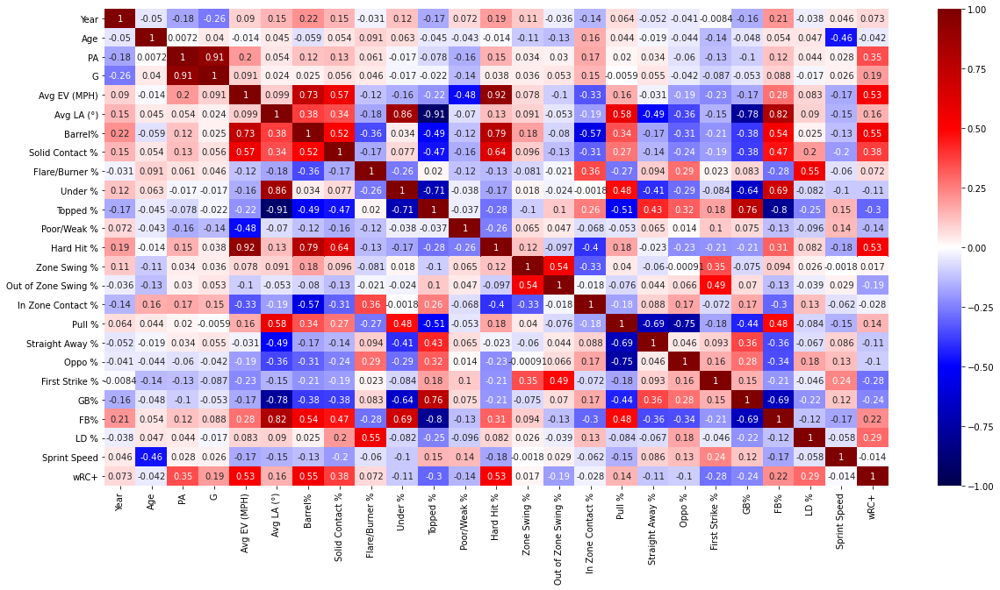

In [44]:
sns.heatmap(stats_2_df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

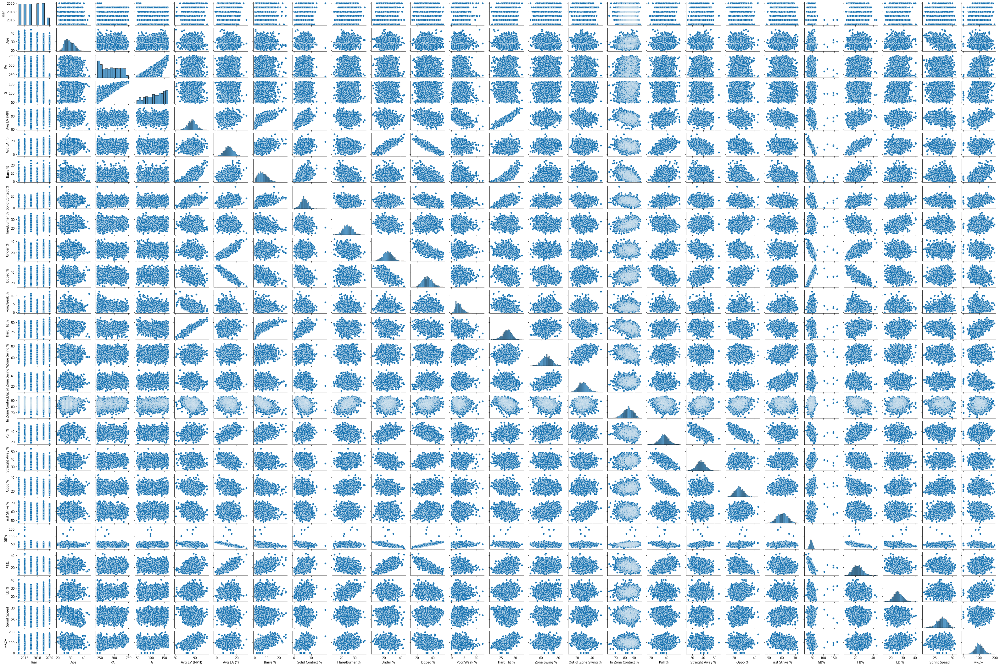

In [45]:
sns.pairplot(stats_2_df, height=1.2, aspect=1.5);

First thing - a few players have GB rate over 100% and In Zone Contact Rate which may be over 100%, which doesn't make sense.  Let's see

Ground Ball Rate:

In [47]:
stats_2_df[stats_2_df['GB%'] > 100]

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID,wRC+
94,"Gillaspie, Conor",2016.0,29.0,205.0,101.0,88.9,13.6,4.3,6.1,26.8,...,34.8,26.8,57.1,146.0,20.1,32.3,25.5,[/savant-player/543216],Conor Gillaspie-2016,96.0
165,"Burns, Billy",2016.0,27.0,332.0,97.0,82.9,6.7,0.0,0.0,21.5,...,38.7,30.5,68.7,104.0,12.9,21.5,29.3,[/savant-player/542993],Billy Burns-2016,51.0
470,"Butler, Billy",2016.0,30.0,274.0,97.0,90.3,8.7,8.1,8.1,28.0,...,43.6,28.0,58.8,163.0,19.9,32.7,23.7,[/savant-player/456714],Billy Butler-2016,104.0
651,"Lowrie, Jed",2016.0,32.0,369.0,87.0,86.0,11.9,0.7,4.3,31.8,...,31.0,32.1,56.6,146.0,23.5,28.2,25.5,[/savant-player/476704],Jed Lowrie-2016,76.0
1226,"Suarez, Eugenio",2015.0,24.0,398.0,97.0,88.5,14.9,5.3,4.2,21.8,...,37.3,25.4,65.3,119.0,24.3,29.2,27.0,[/savant-player/553993],Eugenio Suarez-2015,106.0


These are wrong, but the other batted ball data looks right.  Fixing these:

In [48]:
stats_2_df.iloc[94, 21] = 37.8 #Gillaspie, 2016
stats_2_df.iloc[165, 21] = 55.9 #Burns, 2016
stats_2_df.iloc[470, 21] = 43.1 #Butler, 2016
stats_2_df.iloc[651, 21] = 43.3 #Lowrie, 2016
stats_2_df.iloc[1226, 21] = 41.9 #Suarez, 2015

In [49]:
stats_2_df[stats_2_df['GB%'] > 100]

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID,wRC+


In Zone Contact:

In [50]:
stats_2_df[stats_2_df['In Zone Contact %'] > 100]

,Player,Year,Age,PA,G,Avg EV (MPH),Avg LA (°),Barrel%,Solid Contact %,Flare/Burner %,...,Straight Away %,Oppo %,First Strike %,GB%,FB%,LD %,Sprint Speed,Player Link,Player_Year_ID,wRC+


### Replotting the pair plot and heat map with the cleaned data:

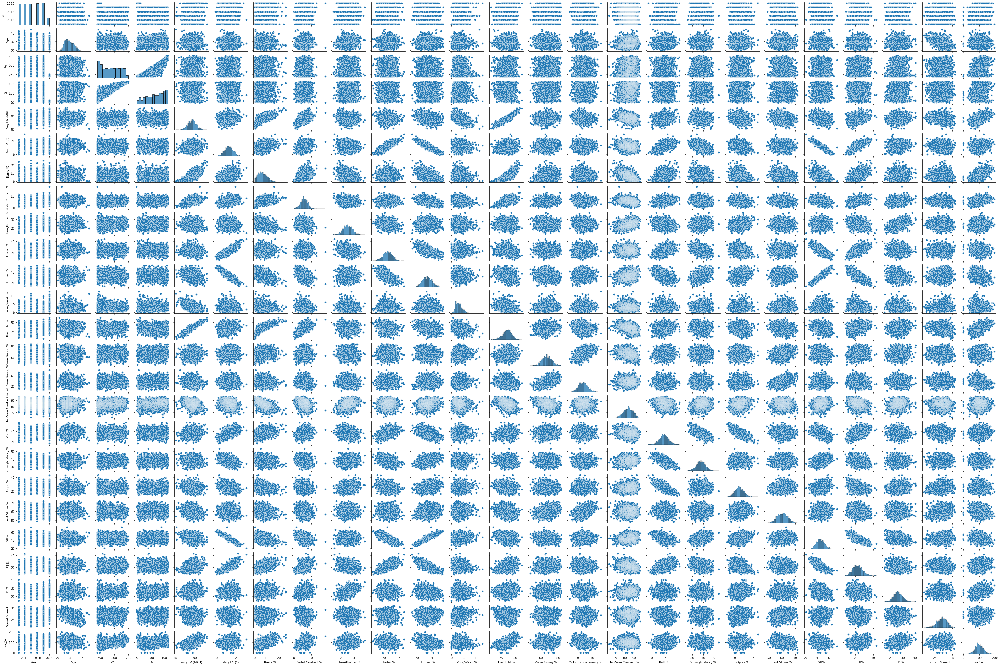

In [51]:
sns.pairplot(stats_2_df, height=1.2, aspect=1.5);

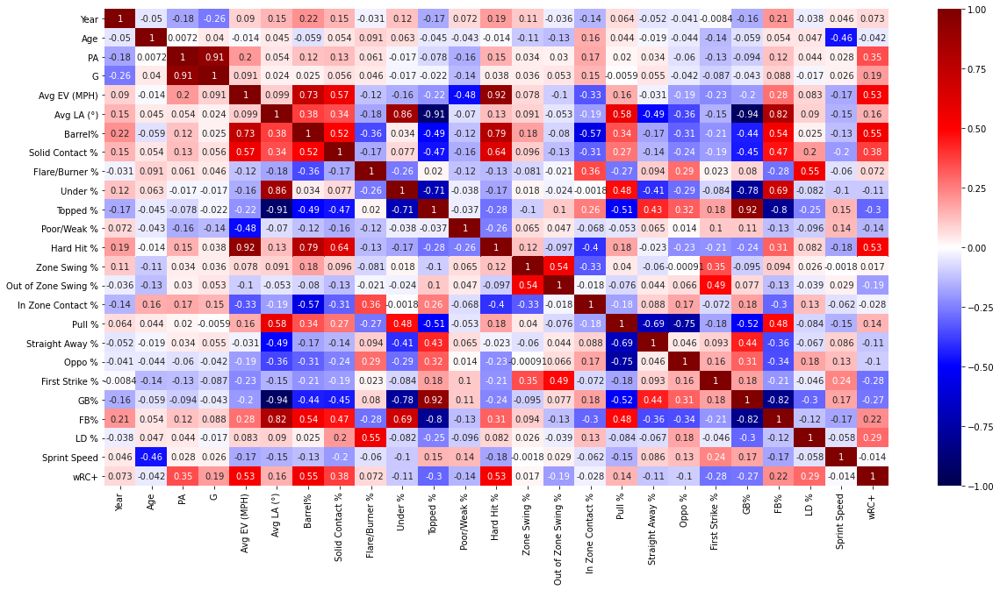

In [52]:
sns.heatmap(stats_2_df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);